In [1]:
import networkx as nx
import altair as alt
import nx_altair as nxa
from nx_altair.core import to_pandas_nodes

alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [41]:
G = nx.read_gml('/mnt/data/OSM-S4/osm-s4-graph.gml')
pos = nx.kamada_kawai_layout(G, scale=0.6)
#pos = nx.spectral_layout(G)

In [33]:
G.nodes()[list(G.nodes())[0]]

{'C3SP2': 0.25,
 'SMILES': 'Cc1cc(\\C=C\\2/S\\C(=N/c3ccccc3)\\NC2=O)c(C)n1c4ccc(cc4)S(=O)(=O)N',
 'Series': '1',
 'activity': 5.60205999132796,
 'community': 'm01',
 'degree': 46,
 'louvain': 'm01'}

In [34]:
comm_sort = to_pandas_nodes(G, pos)['community'].value_counts().sort_index()
comm_sort

m01     52
m02    207
m03     49
m04     37
Name: community, dtype: int64

In [35]:
to_pandas_nodes(G, pos).columns

Index(['Series', 'community', 'louvain', 'C3SP2', 'x', 'degree', 'y', 'SMILES', 'activity'], dtype='object')

In [42]:
# Draw the graph using Altair
viz = nxa.draw_networkx(
    G=G,
    pos=pos,
    node_size=80,
    alpha=1.0)

# viz.interactive()

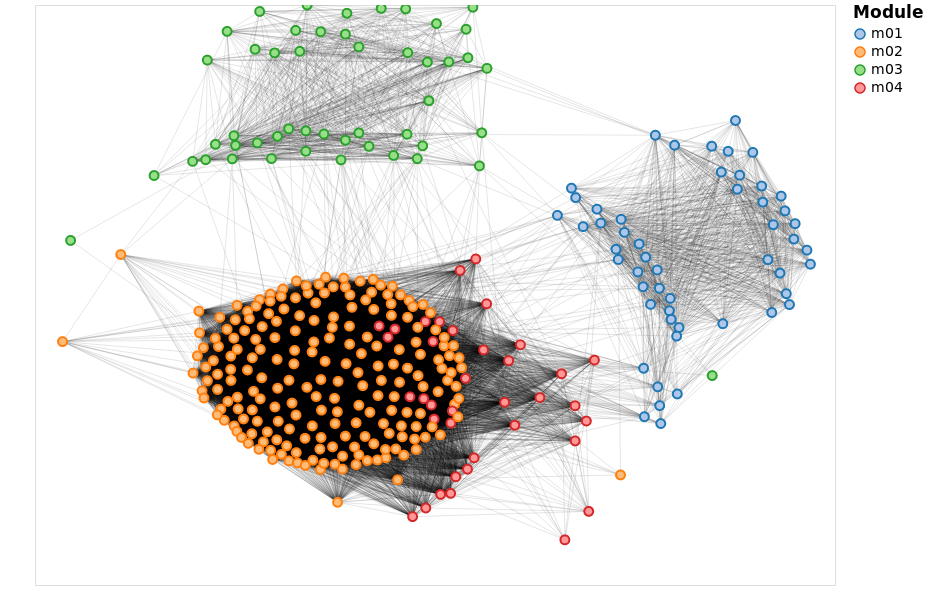

In [45]:
edges = viz.layer[0]
nodes = viz.layer[1]
color_range = ["#AEC7E8", "#FFBB78", "#98DF8A", "#FF9896", "#C5B0D5", "#C49C94", "#F7B6D2", "#C7C7C7"]
color_strong_range = ["#1F77B4", "#FF7F0E", "#2CA02C", "#D62728", "#9467BD", "#8C564B", "#E377C2", "#C7C7C7"]

edges = edges.encode(
    opacity=alt.value(0.1)
)

nodes = nodes.encode(
    stroke = alt.Color('community', title='Module',
                   scale=alt.Scale(domain=comm_sort.index.tolist(),
                                   range=color_strong_range)),
    fill=alt.Color('community', title='Module', 
                   scale=alt.Scale(domain=comm_sort.index.tolist(),
                                   range=color_range))
)

viz = alt.layer(edges, nodes)

viz.configure_axis(
        ticks=False,
        grid=False,
        domain=False,
        labels=False,
    ).configure_legend(
  titleFontSize=17,
  labelFontSize=14,

).properties(width=800, height=580).interactive()

# Common Core

In [70]:
from rdkit import Chem
from rdkit.Chem import AllChem
import rdkit.Geometry
from rdkit.Chem import rdFMCS
from rdkit.Chem.Draw import IPythonConsole, MolToFile

In [47]:
molecules_df = to_pandas_nodes(G, pos)
molecules_df.head()

,Series,community,louvain,C3SP2,x,degree,y,SMILES,activity
OSM-A-1,1,m01,m01,0.25,0.352994,46,0.353035,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,5.60206
OSM-A-2,1,m01,m01,0.5,0.301985,50,0.117309,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,5.98944
OSM-A-3,1,m01,m01,0.25,0.355581,44,0.0974767,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,6.93132
OSM-E-1,1,m01,m01,0,0.385498,44,-0.0117288,CN(CC(=O)N)S(=O)(=O)c1cc(C)n(c1C)c2ccc(F)cc2,5.60206
OSM-E-2,1,m01,m01,0,0.382256,46,-0.0280149,Cc1cc(c(C)n1c2ccc(F)cc2)S(=O)(=O)NCC(=O)N,5.60206


In [97]:
selected_module = 'm04'

module = molecules_df[molecules_df['community'] == selected_module]
module.head()

,Series,community,louvain,C3SP2,x,degree,y,SMILES,activity
OSM-S-66,2,m04,m04,0.25,0.22857,10,-0.414313,C(Sc1nc[nH]n1)c2ccccc2,5.60206
OSM-S-352,4,m04,m04,0.5,0.0919873,247,-0.108116,Fc1ccc(cc1)c2nnc3cncc(OCCc4ccccc4)n23,6.43652
OSM-S-369,4,m04,m04,0.5,0.0345343,238,-0.146483,FC(F)Oc1ccc(cc1)c2nnc3cncc(OCCc4ccccc4)n23,6.52143
OSM-S-372,4,m04,m04,0.5,0.0473409,242,-0.0381684,FC(F)Oc1ccc(cc1)c2nnc3cncc(OCc4cn(Cc5ccccc5)nn...,5.60206
OSM-S-383,4,m04,m04,0.5,-0.0145784,239,-0.0301713,COc1cccc(CCOc2cncc3nnc(c4ccc(OC(F)F)cc4)n23)c1,6.86967


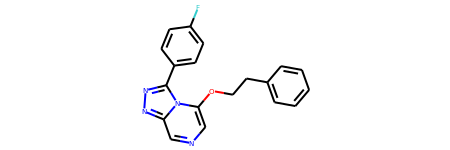

In [98]:
highest_degree_id = module['degree'].astype(int).idxmax()
highest_degree_mol = Chem.MolFromSmiles(module.loc[highest_degree_id]['SMILES'])
highest_degree_mol

In [99]:
MolToFile(highest_degree_mol, 
          "/mnt/data/OSM-S4/%s.png" % selected_module, 
          size=(300, 300), kekulize=True, wedgeBonds=True, imageType='png',
          fill=None)

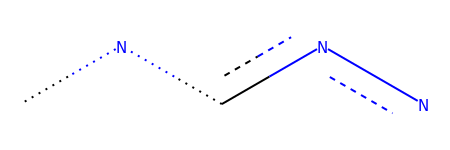

In [61]:
res=rdFMCS.FindMCS([Chem.MolFromSmiles(mol) for mol in m01['SMILES']])
pattern = Chem.MolFromSmarts(res.smartsString)
pattern

In [30]:
matching = highest_degree_mol.GetSubstructMatch(pattern)

Chem.Draw.MolToFile(highest_degree_mol, 'r02_pattern.svg', size=(170, 80), highlightAtoms=matching)